<center><h1><b>Hito 2 - Implementación</b></h1></center>
<center><h2><b>Automotora</b></h2></center>

* ### **Alumnos: Thomas Peet, Osvaldo Muñoz, Francisco Sepúlveda, Tania Venegas**

---

## **1. Preparación del ambiente de trabajo**

### **Definición del problema:**

El tema se denomina Automotora, que consiste en realizar un estudio de mercado a partir de una base de datos de distintos automóviles y sus precios de venta. A través de este estudio, se requiere determinar si, dadas las condiciones de un automóvil, a la automotora le conviene comprarlo o no.

De modo opcional, otros requerimientos son:
* Definir una propuesta de inversión (lista de automóviles convenientes).
* Definir una estrategia de venta por gama de vehículos.
* Encontrar oportunidades de compra y venta entre ciudades/estados.

### **Datos a utilizar:**
Se dispone de 2 archivos que, en conjunto forman una base de datos de 852.121 entradas, donde se describen las transacciones de ventas de automóviles entre el año 1997 y 2018. Todas estas ventas fueron realizadas en Estados Unidos en 51 estados en 2.553 ciudades:

* true_cars_train.csv (639.145 registros)
* true_cars_test.csv (212.977 registros)

También disponemos de una base de datos que une la información de ambos archivos:
* true_car_listings.csv (852.123 registros)

### **Solución Propuesta (Hito 1):**

* ##### **Modelo de Regresión**
    Definiremos la variable **Precio** como vector objetivo, la que es vista como variable intermedia, ya que el objetivo final es utilizar esta predicción para determinar si se compra o no el vehículo.

* ##### **Modelo de Clasificación**
    Crearemos una nueva variable (binaria) como vector objetivo, cuyos valores se obtendrán en base a algún criterio determinado, por ejemplo, ROI (Return on Investments).

### **Replanteamiento de Solución Propuesta (Hito 2):**

Después del preprocesamiento de los datos, se realizará la clusterización con variables numéricas y luego una segmentación en base a las variables categóricas. Se eliminarán los outliers y se aplicará el  Modelo de Regresión para predecir el precio de mercado de los vehículos. Posteriormente, se calculará el ROI y se tomará la decisión en base a los resultados.

#### **Esquema del sistema de recomendación de compra de autos**
<center>
<img src="flujo.png?3" width="1100"/>
</center>

#### **Librerías**

In [405]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
plt.style.use('seaborn')
sns.set_context("notebook")
# plt.rcParams['figure.figsize'] = (10, 6)

In [406]:
import funciones as f
import requests, json
import re

In [407]:
%matplotlib inline
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, normalize
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from feature_engine.wrappers import SklearnTransformerWrapper
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

#### **Ingesta de Datos**

In [408]:
df_init = pd.read_csv('../db/true_car_listings.csv')
df = df_init.copy()

In [409]:
df.head()

,Price,Year,Mileage,City,State,Vin,Make,Model
0,8995,2014,35725,El Paso,TX,19VDE2E53EE000083,Acura,ILX6-Speed
1,10888,2013,19606,Long Island City,NY,19VDE1F52DE012636,Acura,ILX5-Speed
2,8995,2013,48851,El Paso,TX,19VDE2E52DE000025,Acura,ILX6-Speed
3,10999,2014,39922,Windsor,CO,19VDE1F71EE003817,Acura,ILX5-Speed
4,14799,2016,22142,Lindon,UT,19UDE2F32GA001284,Acura,ILXAutomatic


Nuestro DataFrame inicial tiene 8 variables de transacciones de Venta de vehículos:
- Price: Precio de Venta del Auto
- Year: Año de Fabricacion del auto
- Mileage: Millas 
- City: Ciudad de Venta
- State: Estado donde se esta vendiendo el Auto
 Vin: Numero de Serie del Auto
- Make: Marca
- Model: Modelo

In [410]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 852122 entries, 0 to 852121
Data columns (total 8 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   Price    852122 non-null  int64 
 1   Year     852122 non-null  int64 
 2   Mileage  852122 non-null  int64 
 3   City     852122 non-null  object
 4   State    852122 non-null  object
 5   Vin      852122 non-null  object
 6   Make     852122 non-null  object
 7   Model    852122 non-null  object
dtypes: int64(3), object(5)
memory usage: 52.0+ MB


Solo los 3 primeros atributos son numéricos, y el resto categóricos

In [411]:
df.describe()

,Price,Year,Mileage
count,852122.000000,852122.000000,8.521220e+05
mean,21464.100210,2013.289145,5.250779e+04
std,13596.202241,3.414987,4.198896e+04
min,1500.000000,1997.000000,5.000000e+00
25%,13000.000000,2012.000000,2.383600e+04
50%,18500.000000,2014.000000,4.025600e+04
75%,26995.000000,2016.000000,7.218600e+04
max,499500.000000,2018.000000,2.856196e+06


Con el Describe podemos observar entre qué rangos se mueven los precios de los autos, entre qué años se vendieron, y el rango de Kilometraje que poseen. 

#### **Preprocesamiento y limpieza inicial**

##### Limpieza

Se realiza el borrado de caracteres inválidos y observaciones con error de datos, estandarización a minúsculas de columnas y observaciones, renombre de columnas y desglose de partes principales de atributo Vin

In [412]:
df=f.limpieza(df, df_init)

In [413]:
df.columns

Index(['precio', 'anio_fabricacion', 'kilometraje', 'ciudad_transaccion',
       'estado', 'fabricante', 'modelo', 'pais_origen', 'categoria', 'planta'],
      dtype='object')

In [414]:
df=df.drop(df.loc[df['kilometraje']>150000].index)

In [415]:
df

,precio,anio_fabricacion,kilometraje,ciudad_transaccion,estado,fabricante,modelo,pais_origen,categoria,planta
0,8995,2014,35725,el paso,tx,acura,ilx6-speed,1,V,E
1,10888,2013,19606,long island city,ny,acura,ilx5-speed,1,V,E
2,8995,2013,48851,el paso,tx,acura,ilx6-speed,1,V,E
3,10999,2014,39922,windsor,co,acura,ilx5-speed,1,V,E
4,14799,2016,22142,lindon,ut,acura,ilxautomatic,1,U,A
...,...,...,...,...,...,...,...,...,...,...
852117,63215,2017,9,culver city,ca,volvo,s90t6,Y,1,1
852118,72260,2017,3201,englewood,nj,volvo,xc90t6,Y,4,1
852119,55999,2016,28941,fort collins,co,volvo,xc90awd,Y,4,1
852120,60240,2017,3005,san leandro,ca,volvo,v90,Y,4,1


In [416]:
df['kilometraje']=(np.sqrt(df['kilometraje']))

##### Binarización de atributos

Se generan 2 nuevas columnas (rango_anio y rango_kilometros) en las que se agrupan los datos de las columnas 'anio_transaccion' y 'kilometraje' respectivamente, en intervalos definidos (3 y 10).

In [417]:
df['rango_anio'] = f.binarizaAtributo(df, 'anio_fabricacion', 'rango_anio', 3, 'uniform')
df['rango_kilometros'] = f.binarizaAtributo(df, 'kilometraje', 'rango_kilometros', 12, 'uniform')

In [418]:
df.head()

,precio,anio_fabricacion,kilometraje,ciudad_transaccion,estado,fabricante,modelo,pais_origen,categoria,planta,rango_anio,rango_kilometros
0,8995,2014,189.010582,el paso,tx,acura,ilx6-speed,1,V,E,2.0,5.0
1,10888,2013,140.021427,long island city,ny,acura,ilx5-speed,1,V,E,2.0,4.0
2,8995,2013,221.022623,el paso,tx,acura,ilx6-speed,1,V,E,2.0,6.0
3,10999,2014,199.804905,windsor,co,acura,ilx5-speed,1,V,E,2.0,6.0
4,14799,2016,148.801882,lindon,ut,acura,ilxautomatic,1,U,A,2.0,4.0


In [419]:
df.rango_kilometros.value_counts()

5.0     152504
6.0     135615
4.0     111976
7.0      82086
8.0      74889
3.0      68116
9.0      64368
10.0     43403
2.0      38390
11.0     27014
1.0      17452
0.0       9409
Name: rango_kilometros, dtype: int64

##### Segmentación de Marcas por Gama

Esta segmentación se realizó a partir de las marcas analizadas en el mercado, identificando donde se mueven y el prestigio que tiene cada marca en el mercado.
Se definieron 3 categorias: Gama de Lujo, Gama Alta y Gama Media.

In [420]:
df.loc[df['fabricante'].isin(f.gamas['lujo']),'gama']='lujo'
df.loc[df['fabricante'].isin(f.gamas['alta']),'gama']='alta'
df.loc[df['fabricante'].isin(f.gamas['media']),'gama']='media'

In [421]:
df['gama'].value_counts()

media    625676
alta     198415
lujo       1084
Name: gama, dtype: int64

In [422]:
# f.get_pie(df['gama'], 'Porcentaje Gamas dataset ', 10)

##### Recodificación de Modelos

In [423]:
marcas = df.fabricante.unique()
modelos = df.modelo.unique()

In [424]:
# Revisando las denominaciones de los modelos asociados a una marca (alta desagregación) 
print(list(pd.Series(df.loc[df['fabricante'] == 'buick','modelo'].unique()).sort_values()))

['cascadaconvertible', 'cascadapremium', 'cascadasport', 'century4dr', 'centurycustom', 'enclaveawd', 'enclavebase', 'enclaveconvenience', 'enclavefwd', 'enclaveleather', 'enclavepremium', 'encore', 'encoreawd', 'encoreconvenience', 'encoreencore', 'encorefwd', 'encoreleather', 'encorepremium', 'encoresport', 'envisionawd', 'envisionfwd', 'envisionpremium', 'lacrosse4dr', 'lacrosseawd', 'lacrossecxl', 'lacrossefwd', 'lacrosseleather', 'lacrossepremium', 'lesabre4dr', 'lesabrelimited', 'lucerne4dr', 'park', 'rainier4dr', 'rainierawd', 'rainierrwd', 'regal', 'regal1fl', 'regal4dr', 'regalbargain', 'regalbase', 'regalfleet', 'regalfwd', 'regalgs', 'regalpremium', 'regalregal', 'regalsedan', 'regalsport', 'regalturbo', 'rendezvous4dr', 'rendezvouscx', 'rendezvouscxl', 'rendezvousfwd', 'riviera2dr', 'skylark4dr', 'terraza4dr', 'verano', 'verano1sd', 'verano1sv', 'verano4dr', 'veranobase', 'veranoconvenience', 'veranofwd', 'veranoleather', 'veranopremium', 'veranosedan', 'veranosport', 'vera

Los modelos están muy desagregados innecesariamente. Hay modelos que son distintos por detalles minimos. Por ejemplo: 'lacrosse4dr', 'lacrosseawd', 'lacrossecxl', etc. Esto hace que sean muchos más modelos y con menos datos cada segmento.

Se revisan los modelos por cada marca y se define una nombre común para un grupo de Modelos con denominación similar (a criterio, y validando en google si corresponde agruparlos).

In [425]:
# df=f.recodifica_modelos(df, marcas, 'modelo_new', df['fabricante'], 'modelo')

In [426]:
for marca in marcas:
    if marca in f.lista_cambios.keys():
        df.loc[df['fabricante'] == marca,'modelo_new'] = df.loc[df['fabricante'] == marca,'modelo'].apply(lambda x: f.replacements_batch(x, f.lista_cambios[marca]))
    else:
        df.loc[df['fabricante'] == marca,'modelo_new'] = df.loc[df['fabricante'] == marca, 'modelo']

In [427]:
df.columns

Index(['precio', 'anio_fabricacion', 'kilometraje', 'ciudad_transaccion',
       'estado', 'fabricante', 'modelo', 'pais_origen', 'categoria', 'planta',
       'rango_anio', 'rango_kilometros', 'gama', 'modelo_new'],
      dtype='object')

In [428]:
df

,precio,anio_fabricacion,kilometraje,ciudad_transaccion,estado,fabricante,modelo,pais_origen,categoria,planta,rango_anio,rango_kilometros,gama,modelo_new
0,8995,2014,189.010582,el paso,tx,acura,ilx6-speed,1,V,E,2.0,5.0,alta,ilx
1,10888,2013,140.021427,long island city,ny,acura,ilx5-speed,1,V,E,2.0,4.0,alta,ilx
2,8995,2013,221.022623,el paso,tx,acura,ilx6-speed,1,V,E,2.0,6.0,alta,ilx
3,10999,2014,199.804905,windsor,co,acura,ilx5-speed,1,V,E,2.0,6.0,alta,ilx
4,14799,2016,148.801882,lindon,ut,acura,ilxautomatic,1,U,A,2.0,4.0,alta,ilx
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
852117,63215,2017,3.000000,culver city,ca,volvo,s90t6,Y,1,1,2.0,0.0,alta,s90
852118,72260,2017,56.577381,englewood,nj,volvo,xc90t6,Y,4,1,2.0,1.0,alta,xc90
852119,55999,2016,170.120545,fort collins,co,volvo,xc90awd,Y,4,1,2.0,5.0,alta,xc90
852120,60240,2017,54.817880,san leandro,ca,volvo,v90,Y,4,1,2.0,1.0,alta,v90


In [429]:
# f.get_barplot(df['modelo_new'], 'Modelos Recodificados Mas Comunes Dentro del DataSet', 'Modelo', 'Cantidad')

---

## **2. Análisis descriptivo y pre selección de atributos**

### **Análisis univariado de atributos y vector(es) objetivo(s)**

##### ***Marca***

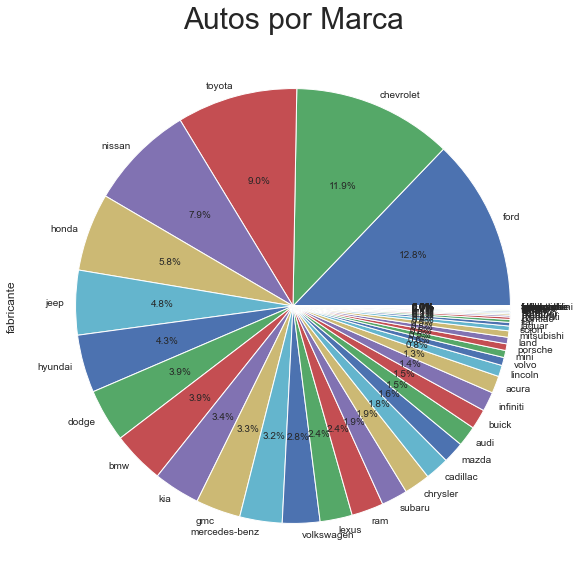

In [430]:
f.get_pie(df['fabricante'], 'Autos por Marca', 10)

Este "pastel" nos sirve para ver la concentración de Marcas dentro del dataset: 3 marcas (ford, chevrolet y toyota están cerca del 10% de la ventas).

##### ***Estados***

In [431]:
# f.get_barplot(df['estado'], 'Estados Mas Comunes Dentro del DataSet', 'Estados', 'Cantidad')

Este gráfico de barras nos permite visualizar la concentración de Estados (en USA) donde se han producido las transacciones.

##### ***Modelos***

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


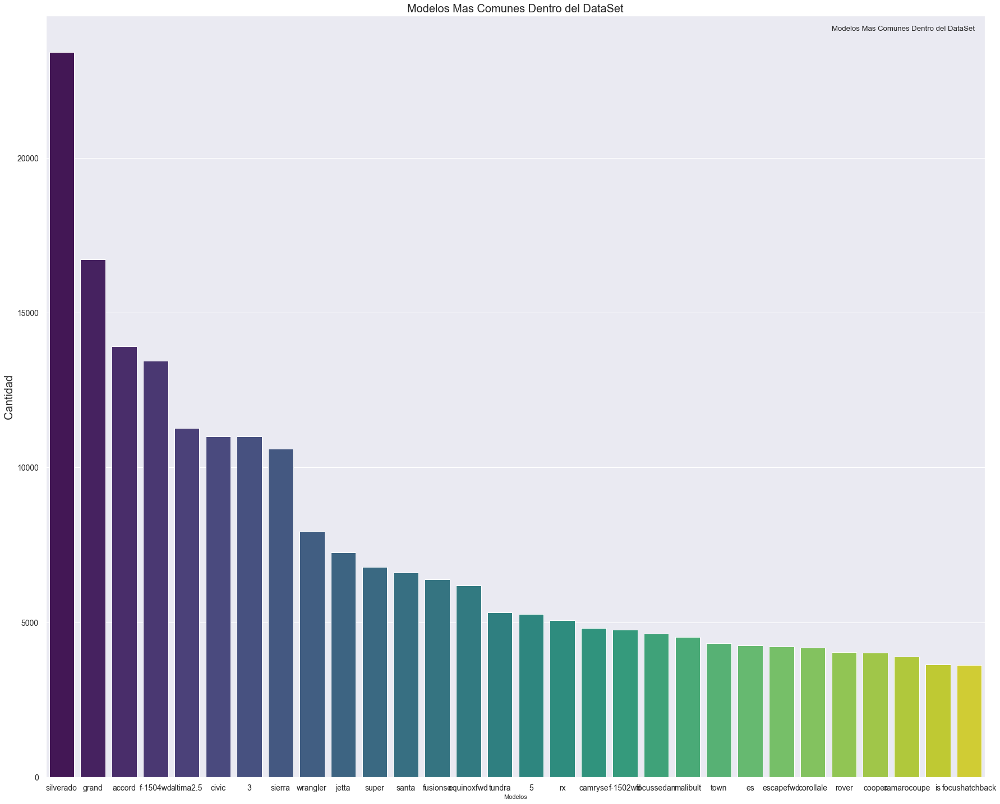

In [432]:
f.get_barplot(df['modelo'], 'Modelos Mas Comunes Dentro del DataSet', 'Modelos', 'Cantidad')

Este gráfico de barras nos permite visualizar la concentración de Modelos vendidos.

##### ***Años***

In [433]:
# f.get_barplot(df['anio_fabricacion'], 'Años Mas Comunes Dentro del DataSet', 'Año', 'Cantidad')

Este gráfico de barras nos permite visualizar la concentración de ventas de vehículos en cada uno de los Años donde se han realizado las transacciones.

##### ***Gama***

In [434]:
# f.get_pie(df['gama'], 'Autos por gama', 10)

Este "pastel" nos muestra la concentración de ventas según gamas de vehículos (gama).

##### ***Precios de venta por Marca***

In [435]:
# f.get_barplot_horiz(df, 'fabricante', 'Marca', 'precio', 'Precio')

Este gráfico nos muestra los precios de venta promedio por Marca.

##### ***Kilometraje*** 

In [436]:
f.get_histplot(df, 'kilometraje')

TypeError: get_histplot() missing 1 required positional argument: 'limite'

In [ ]:
plot=(np.sqrt(df['kilometraje']))
plot
df['kilometraje']=plot

Text(0.5, 1.0, 'Histograma de  Kilometraje')

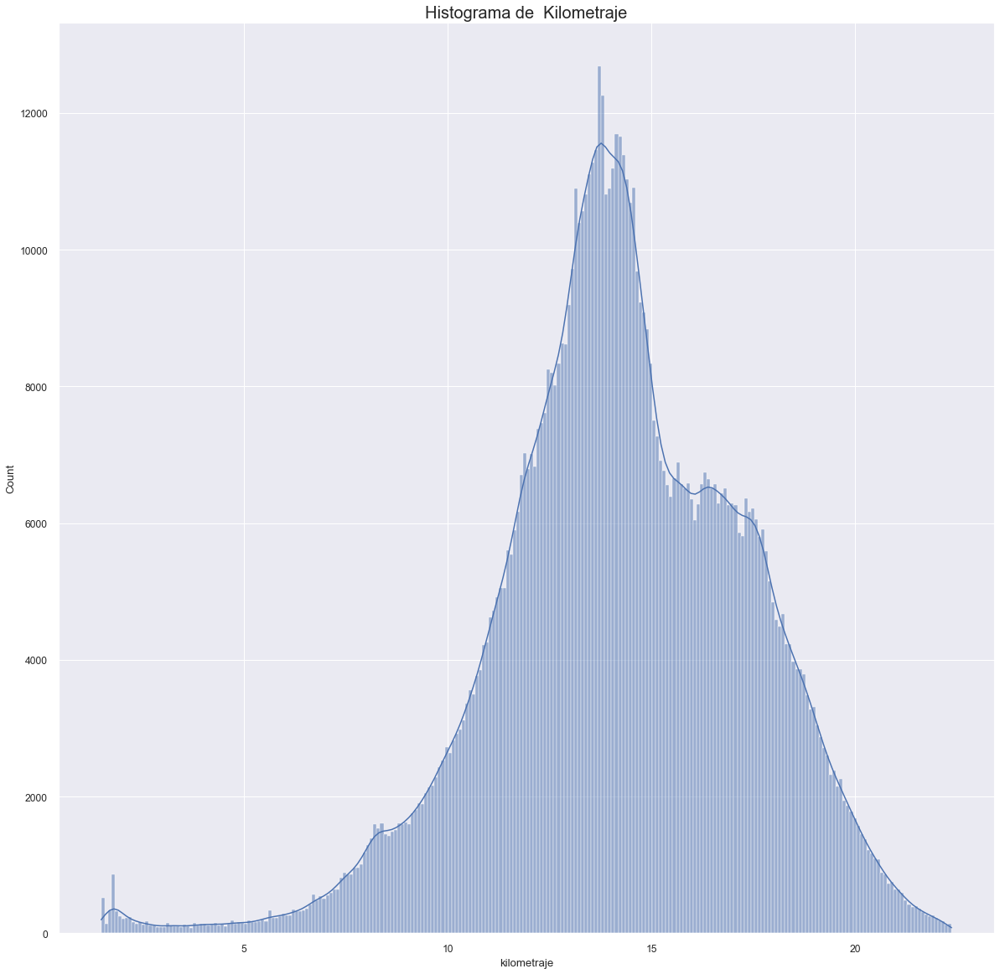

In [ ]:

plt.figure( figsize = (20,20))
sns.histplot(data=plot,kde=True)
plt.title('Histograma de  Kilometraje', fontsize=20)


Text(0.5, 1.0, 'Histograma de  precio')

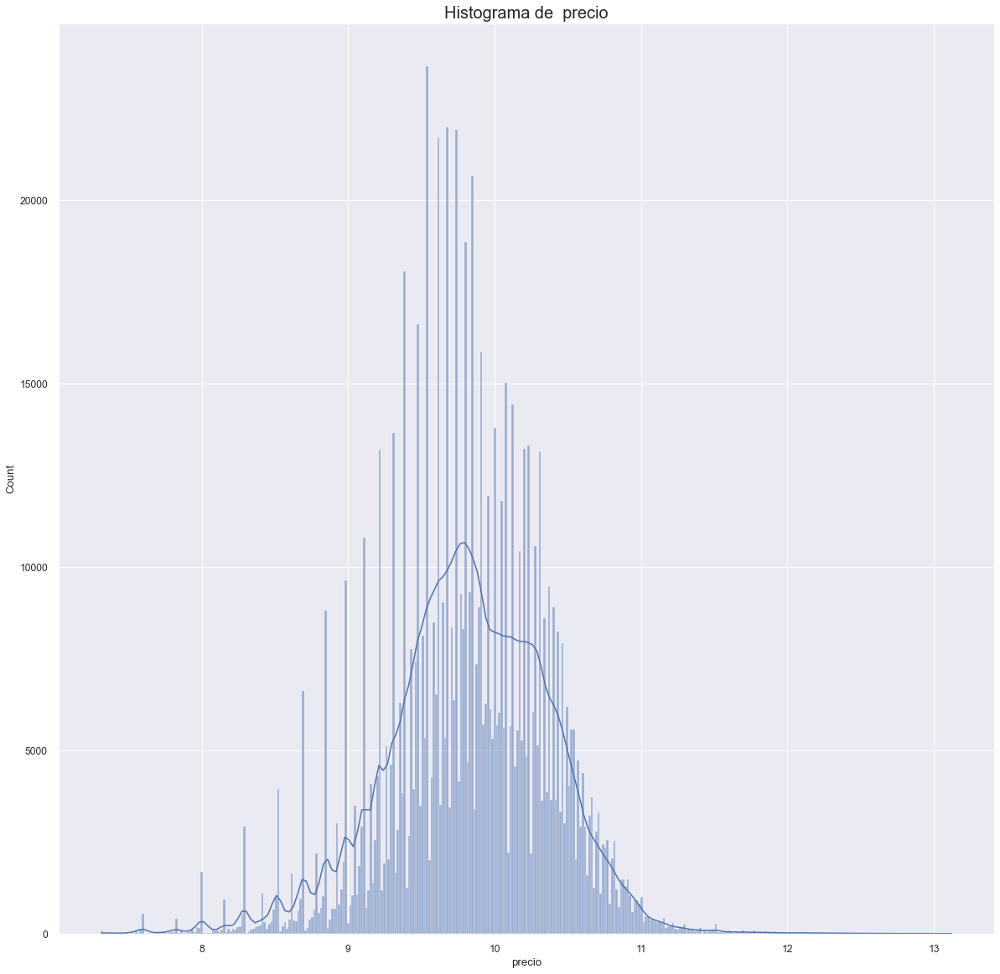

In [ ]:
plot=(np.log(df['precio']))
plot
plt.figure( figsize = (20,20))
sns.histplot(data=plot,kde=True)
plt.title('Histograma de  precio', fontsize=20)

Este histograma nos permite visualizar la distribución de la variable kilometraje

##### ***Precio*** 

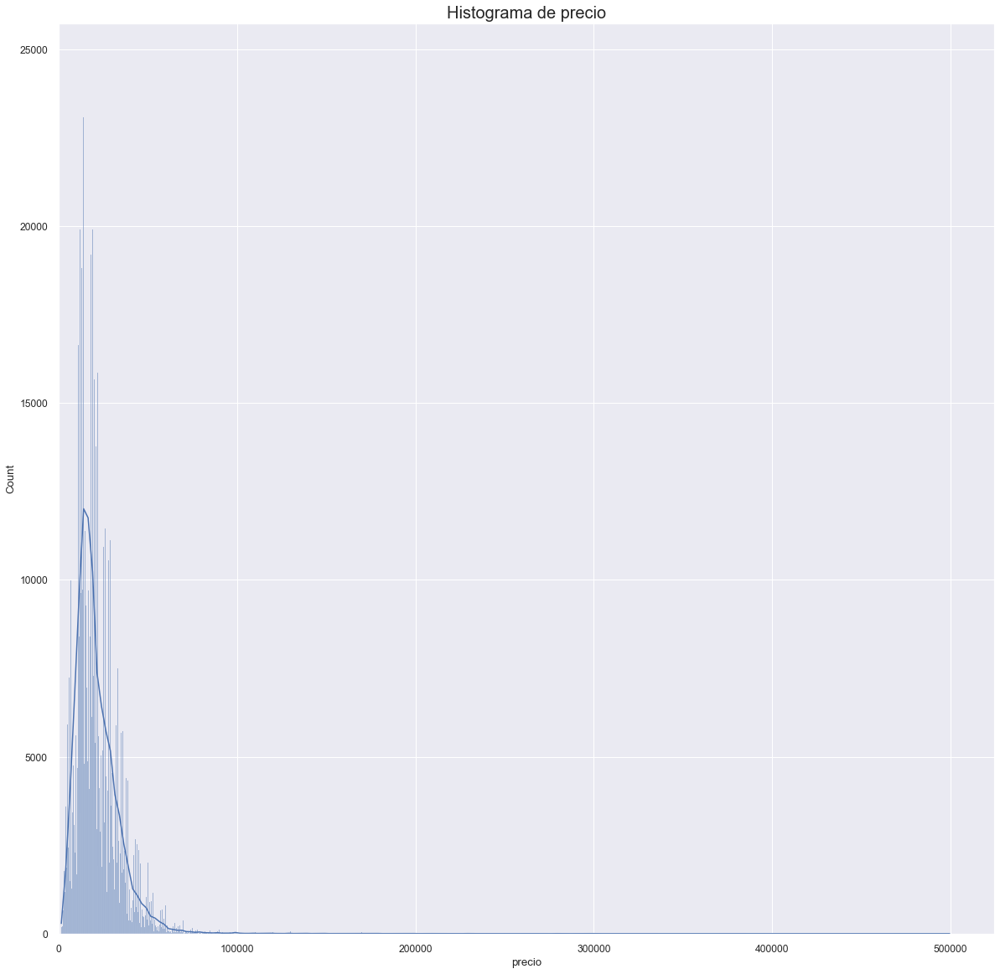

In [ ]:
 f.get_histplot(df, 'precio', None)

Este histograma nos permite visualizar la distribución de la variable precio

In [ ]:
# ZOOM
# f.get_histplot(df, 'precio', 25000)

Este histograma nos permite visualizar la distribución de la variable precio, pero considerando un rango más acotado

### **Análisis bivariado entre atributos y con respecto a vector(es) objetivo(s)**

Si bien en este problema no se tiene un vector objetivo como predicción final, sí es la variable con la cual se decidirá si invertir o no. Por lo tanto, se debe analizar la distribución de esta variable con respecto a las otras.


##### ***Precio- Kilometraje***

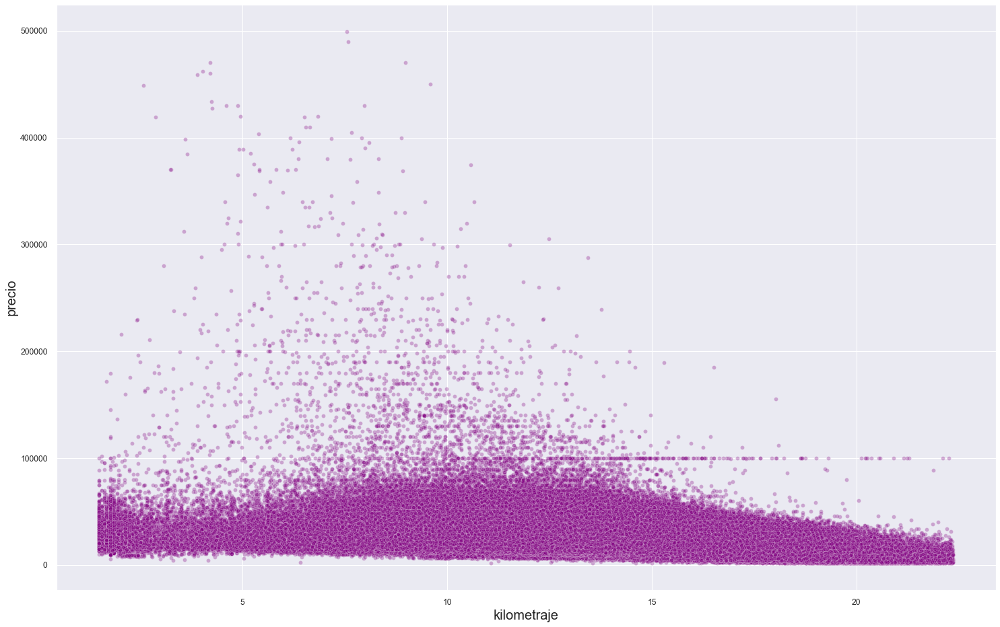

In [ ]:
 f.get_scatterplot(df, 'kilometraje', 'precio')

Este gráfico de dispersión nos muestra los valores de la variable precio (de venta de vehículos) respecto a la variable kilometraje. En general, pasa que a menor kilometraje, mayor el precio.

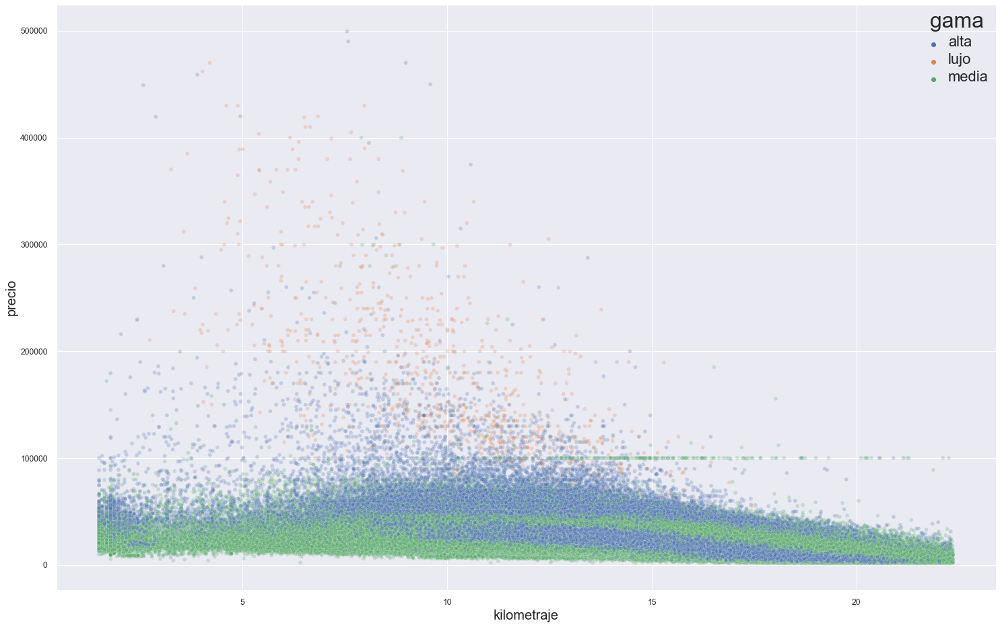

In [ ]:
f.get_scatterplot_hue(df, 'kilometraje', 'precio', 'gama')

Este gráfico de dispersión nos muestra los valores de la variable precio (de venta de vehículos) respecto a la variable kilometraje, pero identificando con los colores el segmento de los vehículos.

##### ***Precio - Año***

In [ ]:
# f.get_scatterplot(df, 'anio_fabricacion', 'precio')

Este gráfico de dispersión nos muestra los valores de la variable precio (de venta de vehículos) respecto al año de venta.

In [ ]:
# f.get_scatterplot_hue(df, 'anio_fabricacion', 'precio', 'gama')

Este gráfico de dispersión nos muestra los valores de la variable precio (de venta de vehículos) respecto al año de venta, identificando con los colores la gama del vehículo.

##### ***Precio- Marca***

In [ ]:
# f.get_boxplot(df, 'fabricante', 'precio')

Este "gráfico de caja" nos permite visualizar la distribución de los precios en base a la Marca de los vehículos, así como también identificar los outliers, el mínimo y máximo y los cuartiles por marca.

##### **Correlaciones**

* El precio tiene una leve correlación positiva con el año y rango_anio.
* Existe correlación negativa entre el precio y el kilometraje/rango_kilometros, así como también entre el año/rango_anio y el kilometraje/rango_kilometros. 

In [ ]:
# f.get_heatmap(df)

---

## **3. Preprocesamiento para modelación y feature engineering**

### **Clusterización**

#### Cluster dataframe

In [ ]:
# df.head()

* Para realizar el cluster solo se considerarán las variables numéricas: precio y kilometraje. De esta forma podremos clasificar los autos por su precio y kilometraje (el año de transaccion es considerada variable categórica).
* Esta clusterización nos ayudará a realizar de mejor manera la regresión posterior, ya que se categorizará de manera mas efectiva al grupo que pertenece cada auto. Por otro lado, además de las clasificaciones ya generadas, se tendrá una de la distribución de estas variables, para que de esta forma sea un grupo más segmentado con una distribución parecida, de modo que sean comparables entre si. 

In [ ]:
# df.columns

In [ ]:
# cluster_df=df.drop(columns=['precio', 'ciudad_transaccion', 'estado', 'fabricante', 'modelo', 
# 'pais_origen', 'categoria', 'digito_conf', 'planta', 'gama', 'modelo_new'])

In [ ]:
# cluster_df=df.drop(columns=['ciudad_transaccion',
# 'estado', 'fabricante', 'modelo', 'pais_origen', 'categoria',
       # 'digito_conf', 'planta', 'gama', 'modelo_new','rango_anio','rango_kilometros','anio_fabricacion'])

In [ ]:
# cluster_df

In [ ]:
#cluster_df[['Make']]=ord.fit_transform(cluster_df[['Make']])
# cluster_df_scaled=normalize(cluster_df)

In [ ]:
# cluster_df_scaled=pd.DataFrame(cluster_df_scaled,columns=cluster_df.columns)
# cluster_df_scaled

#### Kmeans

In [ ]:
# plt.style.use("fivethirtyeight")
# distorsions = []
# for k in range(2, 20):
#     kmeans = KMeans(n_clusters=k)
#     kmeans.fit(cluster_df_scaled)
#     distorsions.append(kmeans.inertia_)

# fig = plt.figure(figsize=(15, 5))
# plt.plot(range(2, 20), distorsions)
# plt.grid(True)
# plt.title('Elbow curve')

In [ ]:
# n = 6
# k_means = KMeans(n_clusters=n)
# k_means.fit(cluster_df_scaled)

In [ ]:
# cluster_labels=k_means.labels_

In [ ]:
# dfcluster=pd.DataFrame(cluster_labels,columns=['Cluster'])

In [ ]:
# df_kmeans=pd.concat([df,dfcluster],axis=1)

In [ ]:
# df_kmeans

In [ ]:
# f.get_barplot(df_kmeans['Cluster'], 'Cluster mas comunes', 'Cluster', 'Cantidad')

In [ ]:
# plt.figure(figsize=(25,10))
# sns.scatterplot(data=cluster_df,c=cluster_labels,cmap='rainbow',x='kilometraje',y='precio')

##### Centroides

In [ ]:
# coordinates of cluster center
# centroids = k_means.cluster_centers_ 
# centroids=pd.DataFrame(centroids,columns=cluster_df_scaled.columns)


In [ ]:
# plt.figure(figsize=(25,10))
# sns.scatterplot(data=cluster_df_scaled,c=cluster_labels,cmap='rainbow',x='kilometraje',y='precio')
# # visualise centroids
# plt.scatter(
#     y=centroids.precio, x=centroids.kilometraje,
#     s=300, marker='*',
#     c='red', edgecolor='black'
# )

#### GMM

In [ ]:
# cluster_df_scaled

In [ ]:
# n_components = np.arange(1, 20,4)
# models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(cluster_df_scaled)
#           for n in n_components]

# plt.plot(n_components, [m.bic(cluster_df_scaled) for m in models], label='BIC')
# plt.plot(n_components, [m.aic(cluster_df_scaled) for m in models], label='AIC')
# plt.legend(loc='best')
# plt.xlabel('n_components');

In [ ]:
# Training model
# from sklearn.mixture import GaussianMixture

# gmm = GaussianMixture(n_components=10)
# y_GMM = gmm.fit(cluster_df_scaled)

In [ ]:
# y_GMM= gmm.predict(cluster_df_scaled)

# # We called the df, that's why we need to refer to previous df to add cluster numbers
# df_GMM = df.copy()
# # Checking number of items in clusters and creating 'Cluster' column
# df_GMM['Cluster'] = y_GMM
# df_GMM

In [ ]:
# f.get_barplot(df_GMM['Cluster'], 'Cluster mas comunes', 'Cluster', 'Cantidad')

In [ ]:
# plt.figure(figsize=(25,10))
# sns.scatterplot(data=cluster_df,c=df_GMM['Cluster'],cmap='rainbow',x='kilometraje',y='precio')

In [ ]:
# plt.figure(figsize=(25,10))
# sns.scatterplot(y=cluster_df_scaled['precio'], x=cluster_df_scaled['kilometraje'],c=df_GMM['Cluster'])
# plt.xticks(rotation=70);

#### K-MODES

- Se realizó el procedimiento con K-Modes en el Proyecto.ipynb donde no se obtuvo nada lógico con respecto a los cluster categóricos como el año. Por lo tanto, se descarta este metodo.

In [ ]:
# cluster_df=df.drop(columns=['ciudad_transaccion',
#        'estado', 'fabricante', 'modelo', 'pais_origen', 'categoria',
#        'digito_conf', 'planta', 'gama', 'modelo_new','rango_anio','rango_kilometros'])

In [ ]:
# cluster_df.columns

#### Comparación

In [ ]:
# from sklearn.metrics import silhouette_score

In [ ]:
# df_kmeans

In [ ]:
# label=k_means.predict(cluster_df_scaled)

In [ ]:
# silhouette_score(cluster_df_scaled,label)

### **Segmentación**

Se tienen 3 DataSet: df_kmeans, df_GMM y df. Este último no contiene cluster, solo el rango de años ya codificado en la seccion anterior. 

#### DF, Sin Cluster

In [ ]:
np.random.seed(42)
msk = np.random.rand(len(df)) < 0.8 # Tamaño del train
# df['dummy'] = 1
# df['dummy2'] = 1
df_train = df[msk] # Datos para el calculo de modelos y entrenamiento de parámetros
df_test = df[~msk] # Datos de vehículos que analizaremos para proveer una sugerencia de compra

In [ ]:
df_train.shape

(680501, 14)

,rango_anio,fabricante,modelo_new,rango_kilometros,n
0,2.0,chevrolet,silverado,4.0,3861
1,2.0,nissan,altima,4.0,3587
2,2.0,toyota,camry,4.0,3197
3,2.0,chevrolet,malibu,3.0,3153
4,2.0,chevrolet,silverado,3.0,3086
...,...,...,...,...,...
1954,0.0,honda,accord,10.0,51
1955,1.0,cadillac,sts,7.0,51
1956,2.0,hyundai,sonata,0.0,51
1957,2.0,lexus,rx,1.0,51


100%|██████████| 1959/1959 [01:39<00:00, 19.73it/s]


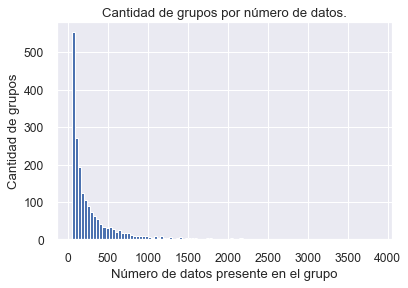

In [ ]:
%matplotlib inline
# Segmentación en base a variables categóricas (incluye numericas categorizadas como rango_anio)

# Variables en torno a cuales se segmentara la data
variables_a_agrupar = ['rango_anio', 'fabricante', 'modelo_new','rango_kilometros'] 
# variables_a_agrupar = ['dummy','dummy2'] 

n_bins = 100 # Numero de bins del histograma
n_threshold = 50 # N mínimo para aparecer en el histograma de N por grupo.
grupos = df_train.groupby(by=variables_a_agrupar)
n_por_grupo, grupos_reducidos = f.cuentas_por_grupo(df_train, grupos, variables_a_agrupar, n_bins, n_threshold)

# Finalmente se agregará una nueva columna al dataframe para indicar a que grupo pertenece la muestra. 
# Esa columna tendrá un valor categórico que codificará las variables por las cuáles se segmentó 
# (ej: g1 -> (marca, modelo, rango_anio) = (nissan, rogue, 4)). Esta información de codificación estará 
# almacenada en un diccionario.
df_copy_train, diccionario_codificacion_grupos = f.variable_de_grupo_en_dataframe(df_train, grupos_reducidos, variables_a_agrupar)

---

In [ ]:
ct1 = f.binarizarAtributo(df, 'anio_fabricacion', 'rango_anio', 7, 'uniform')
ct2 = f.binarizarAtributo(df, 'kilometraje', 'rango_kilometros', 12, 'uniform')

In [ ]:
bordes =  list(ct1.transformers_[0][1].bin_edges_[0])
rangos_anos = [f"{str(int(bordes[i]))} - {str(int(bordes[i+1]))}" for i in range(len(bordes)-1)]
rangos_anos

['1997 - 2000',
 '2000 - 2003',
 '2003 - 2006',
 '2006 - 2009',
 '2009 - 2012',
 '2012 - 2015',
 '2015 - 2018']

In [ ]:
bordes2 =  list(ct2.transformers_[0][1].bin_edges_[0])
rangos_km = [f"{str(int(bordes2[i]))} - {str(int(bordes2[i+1]))}" for i in range(len(bordes2)-1)]
rangos_km


['1 - 3',
 '3 - 4',
 '4 - 6',
 '6 - 8',
 '8 - 10',
 '10 - 11',
 '11 - 13',
 '13 - 15',
 '15 - 17',
 '17 - 18',
 '18 - 20',
 '20 - 22']

(2.0, 'subaru', 'forester', 3.0)

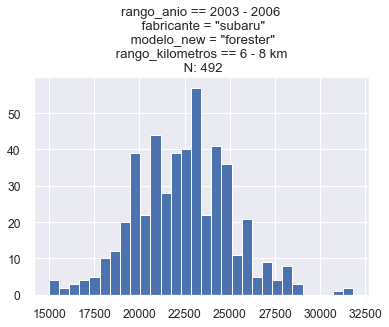

In [ ]:
%matplotlib inline


numero_de_grupo = 342

grupo_tupla = tuple(n_por_grupo.drop(columns='n').iloc[numero_de_grupo].to_list())
grupo = [i for i,k in diccionario_codificacion_grupos.items() if k==grupo_tupla][0]

str_query = '\n '.join([f'{str(a)} = "{str(b)}"' if type(b) == str else f'{str(a)} == {str(rangos_anos[int(b)])}' if str(a) == 'rango_anio' else f'{str(a)} == {str(rangos_km[int(b)])} km' for a, b in zip(
    variables_a_agrupar, diccionario_codificacion_grupos[grupo])])


display(diccionario_codificacion_grupos[grupo])
df_copy_train[df_copy_train.grupo == grupo].precio.hist(bins=30)
plt.title(f'{str_query} \n N: {len(df_copy_train[df_copy_train.grupo == grupo])}');


## **4. Modelos candidatos**

### **Parámetros**

In [ ]:
# Parámetros

# Variables que se eliminan
vars_to_remove_train    = ['gama', 'modelo', 'modelo_new', 'fabricante', 'ciudad_transaccion', 'estado', 'grupo', 'rango_anio', 'rango_kilometros'] # Estas variables no serán parte del entrenamiento del modelo de regresión.
vars_to_remove_test     = ['gama', 'modelo', 'modelo_new', 'fabricante', 'ciudad_transaccion', 'estado', 'rango_anio', 'rango_kilometros'] # Estas variables no se usarán para predecir el precio en las muestras de test.

# Las variables eliminadas fue porque algunas se ocuparon para segmentar, y otras como 'ciudad-transaccion' y 'estado' 
# se eliminan porque se requiere obtener los autos baratos, independiente de donde estén

var_to_estimate         = 'precio' # Esta es la variable a estimar.
roi_threshold           = 8 # Umbral de corte de ROI para la toma de decisión (recomendada en literatura).
model                   = GradientBoostingRegressor(random_state=0) # Base model a utilizar para la regresión.

### **Entrenamiento del regresor de cada grupo y eliminación de Outliers por segmento**

Se entrena un modelo para cada grupo incluído en 'diccionario_codificacion_grupos'. Estos grupos tienen asegurado cierto nivel de datos, para que la regresión sea válida. Se entrega un diccionario con los modelos indexados por grupo.

Entrenando los modelos de cada segmento
Antes de sacar outliers N=680501


100%|██████████| 1959/1959 [03:34<00:00,  9.15it/s]


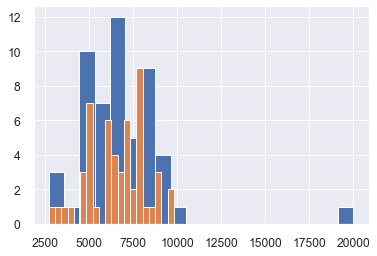

In [ ]:
model_per_group = f.entrenamiento_segmentado(diccionario_codificacion_grupos,
                                            df_copy_train,
                                            vars_to_remove_train, 
                                            var_to_estimate, 
                                            model)

### **Predicción**

Predicción de precio y toma de decisión por muestra. Primeramente, se ubica el grupo correspondiente a cada muestra. Después se detecta si ese grupo existe en el listado de grupos del set de modelos entrenados:
* De ser **positivo**, se predice el precio de todo el grupo y se calcula la variable ROI y decisión. 
* De ser **negativo** se descarta el auto para su compra, por no haber suficientes datos para la toma de decisión.

In [ ]:
resultados = f.new_cars_estimations(model_per_group, 
                                    df_test, 
                                    diccionario_codificacion_grupos, 
                                    variables_a_agrupar, 
                                    vars_to_remove_test, 
                                    estimate=var_to_estimate,
                                    roi_threshold=roi_threshold)

Encontrando los grupos para las muestras de test...


100%|██████████| 6111/6111 [00:00<00:00, 9852.26it/s] 


Prediciendo precio de mercado y tomando decisión de compra para las muestras de test...


100%|██████████| 1959/1959 [01:03<00:00, 30.67it/s]


In [ ]:
resultados

{'g1': {'grupo': ('g1', (0.0, 'bmw', '3', 7.0)),
  'casos_de_compra':        precio  anio_fabricacion  kilometraje ciudad_transaccion estado  \
  27854    5980              2002    18.157347         sacramento     ca   
  29818    5990              2000    18.180065            ansonia     ct   
  28339    7888              2002    17.341687          chantilly     va   
  30417    8990              2002    17.591453       downtingtown     pa   
  
        fabricante modelo pais_origen categoria planta  rango_anio  \
  27854        bmw      3           W         A      K         0.0   
  29818        bmw      3           W         A      F         0.0   
  28339        bmw      3           W         A      E         0.0   
  30417        bmw      3           W         A      J         0.0   
  
         rango_kilometros  gama modelo_new  
  27854               7.0  alta          3  
  29818               7.0  alta          3  
  28339               7.0  alta          3  
  30417         

### **Resultados finales**

<AxesSubplot:>

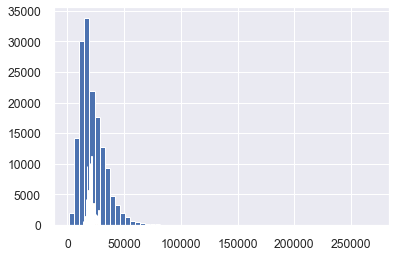

In [ ]:
dfff = [res['resultados_precios'] for res in resultados.values()]
pd.concat(dfff).y_test.hist(bins=60)
pd.concat(dfff).y_pred.hist(bins=60)


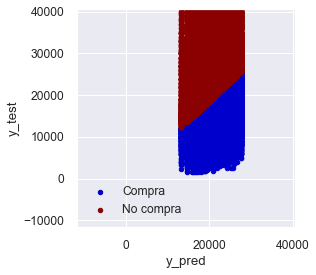

In [ ]:
def add_identity(axes, *line_args, **line_kwargs):
    identity, = axes.plot([], [], *line_args, **line_kwargs, color='green')

    def callback(axes):
        low_x, high_x = axes.get_xlim()
        low_y, high_y = axes.get_ylim()
        low = max(low_x, low_y)
        high = min(high_x, high_y)
        identity.set_data([low, high], [low, high])
    callback(axes)
    axes.callbacks.connect('xlim_changed', callback)
    axes.callbacks.connect('ylim_changed', callback)
    return axes

def scatter_compras_roi(results):
    fig, axs = plt.subplots(1, 1)

    # axs[0] = results.plot.scatter(ax=axs[0], x='y_pred', y='y_test', c='roi', cmap="RdBu")
    axs = results[results.decision==1].plot.scatter(ax=axs, x='y_pred', y='y_test', c='mediumblue')
    axs = results[results.decision==0].plot.scatter(ax=axs, x='y_pred', y='y_test', c='darkred')
    plt.legend(['Compra', 'No compra'])
    # axs[0] = add_identity(axs[0])
    # axs = add_identity(axs)

    min_x = min(results.y_test.min(), results.y_pred.min())
    max_x = min(results.y_test.max(), results.y_pred.max())
    dif_x = max_x - min_x
    min_x = min_x - dif_x * 0.5
    max_x = max_x + dif_x * 0.5

    # axs[0].set_xlim([min_x, max_x])
    # axs[0].set_ylim([min_x, max_x])
    axs.set_xlim([min_x, max_x])
    axs.set_ylim([min_x, max_x])

    # axs[0].set_aspect(1)
    axs.set_aspect(1)
    # plt.draw()

    plt.show()

df_compras                              = pd.concat([res['casos_de_compra'] for res in resultados.values()])
df_no_compras                           = pd.concat([res['casos_de_no_compra'] for res in resultados.values()])
df_precios_estimados_y_venta            = pd.concat([res['resultados_precios'] for res in resultados.values()])
df_precios_estimados_y_venta_de_compras = df_precios_estimados_y_venta.loc[df_precios_estimados_y_venta.index.intersection(df_compras.index)].sort_values(by='roi', ascending=False)
scatter_compras_roi(df_precios_estimados_y_venta)


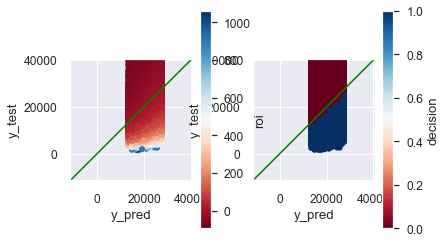

Autos comprados (Ordenados por ROI)


,precio venta,precio predicho de mercado,roi,decision,anio_fabricacion,kilometraje,ciudad_transaccion,estado,fabricante,modelo,pais_origen,categoria,planta,rango_anio,rango_kilometros,gama,modelo_new
594083,1500,17403.203653,1060.213577,1,2004,19.184318,scottsboro,al,mazda,mazda64dr,1,V,5,1.0,8.0,media,mazda6
456488,1600,18154.841368,1034.677585,1,2004,19.354477,davie,fl,hyundai,santa,K,8,U,1.0,8.0,media,santa
226503,1500,16975.778763,1031.718584,1,1999,21.394172,middlesboro,ky,dodge,ram,1,7,J,0.0,10.0,media,ram
217945,1750,19017.867029,986.735259,1,2008,19.736527,chicago,il,dodge,grand,1,8,B,1.0,9.0,media,grand
279450,1950,20945.026892,974.103943,1,2002,19.637613,levittown,pa,ford,explorer4dr,1,M,U,0.0,9.0,media,explorer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439292,15891,17162.477711,8.001244,1,2014,11.586138,paramus,nj,hyundai,sonatagls,5,P,H,2.0,3.0,media,sonata
270127,20967,22644.538159,8.000850,1,2017,14.054618,victorville,ca,ford,escapefwd,1,M,U,2.0,4.0,media,escape
397361,17799,19223.046800,8.000712,1,2016,8.736978,colorado springs,co,honda,cr-vex,2,K,H,2.0,1.0,media,cr-
31688,25500,27540.030100,8.000118,1,2016,13.093880,louisville,ky,bmw,3,W,A,K,2.0,4.0,alta,3


In [ ]:
df_compras                              = pd.concat([res['casos_de_compra'] for res in resultados.values()])
df_no_compras                           = pd.concat([res['casos_de_no_compra'] for res in resultados.values()])
df_precios_estimados_y_venta            = pd.concat([res['resultados_precios'] for res in resultados.values()])
df_precios_estimados_y_venta_de_compras = df_precios_estimados_y_venta.loc[df_precios_estimados_y_venta.index.intersection(df_compras.index)].sort_values(by='roi', ascending=False)
f.scatter_compras_roi(df_precios_estimados_y_venta)

print('Autos comprados (Ordenados por ROI)')
sugerencias_compra = pd.merge(df_precios_estimados_y_venta_de_compras, df_test.loc[df_precios_estimados_y_venta_de_compras.index], left_index=True, right_index=True).drop(columns=['precio','index']).rename(columns={'y_test':'precio venta', 'y_pred':'precio predicho de mercado'})
sugerencias_compra


In [ ]:
df_no_compras.sort_values(by='precio')  

,precio,anio_fabricacion,kilometraje,ciudad_transaccion,estado,fabricante,modelo,pais_origen,categoria,planta,rango_anio,rango_kilometros,gama,modelo_new
770871,12315,2011,16.544285,lithia springs,ga,toyota,rav4fwd,2,3,W,2.0,6.0,media,rav4
380766,12385,2013,12.407842,duluth,ga,honda,civic,1,X,E,2.0,3.0,media,civic
451198,12490,2012,15.247298,cary,nc,hyundai,santa,5,Y,G,2.0,5.0,media,santa
547173,12499,2012,15.242853,bremerton,wa,kia,rio5dr,K,A,6,2.0,5.0,media,rio
829578,12499,2012,13.872822,coconut creek,fl,volkswagen,passat4dr,1,W,C,2.0,4.0,media,passat
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
704057,169991,2015,8.752680,austin,tx,porsche,911gt3,W,0,S,2.0,1.0,alta,911
704071,181990,2017,7.877079,rancho mirage,ca,porsche,911coupe,W,0,S,2.0,1.0,alta,911
704076,189995,2017,9.558915,plano,tx,porsche,911cabriolet,W,0,S,2.0,2.0,alta,911
704082,197685,2017,6.987576,freeport,ny,porsche,911cabriolet,W,0,S,2.0,1.0,alta,911


In [ ]:

np.square(sugerencias_compra.kilometraje)

594083    368.038042
456488    374.595782
226503    457.710607
217945    389.530487
279450    385.635839
             ...    
439292    134.238594
270127    197.532276
397361     76.334789
31688     171.449701
195019    129.680376
Name: kilometraje, Length: 71960, dtype: float64

In [ ]:
sugerencias_compra.describe()

,precio venta,precio predicho de mercado,roi,decision,anio_fabricacion,kilometraje,rango_anio,rango_kilometros
count,71960.000000,71960.000000,71960.000000,71960.0,71960.000000,71960.000000,71960.000000,71960.000000
mean,13397.193719,20244.621496,65.388621,1.0,2012.771234,15.219777,1.758227,5.229197
std,3828.006384,2908.978304,64.353295,0.0,3.395096,2.720607,0.441960,1.928656
min,1500.000000,13291.731579,8.000118,1.0,1997.000000,1.495349,0.000000,0.000000
25%,10900.000000,17641.256652,24.446854,1.0,2011.000000,13.458652,2.000000,4.000000
50%,13548.000000,19916.068259,46.234323,1.0,2014.000000,15.131014,2.000000,5.000000
75%,15995.000000,22001.271486,83.648837,1.0,2015.000000,17.316321,2.000000,7.000000
max,25500.000000,27540.030100,1060.213577,1.0,2018.000000,22.357839,2.000000,11.000000


#### Analisis de Resultados 

In [ ]:
sugerencias_compra

,precio venta,precio predicho de mercado,roi,decision,anio_fabricacion,kilometraje,ciudad_transaccion,estado,fabricante,modelo,pais_origen,categoria,planta,rango_anio,rango_kilometros,gama,modelo_new
594083,1500,17403.203653,1060.213577,1,2004,19.184318,scottsboro,al,mazda,mazda64dr,1,V,5,1.0,8.0,media,mazda6
456488,1600,18154.841368,1034.677585,1,2004,19.354477,davie,fl,hyundai,santa,K,8,U,1.0,8.0,media,santa
226503,1500,16975.778763,1031.718584,1,1999,21.394172,middlesboro,ky,dodge,ram,1,7,J,0.0,10.0,media,ram
217945,1750,19017.867029,986.735259,1,2008,19.736527,chicago,il,dodge,grand,1,8,B,1.0,9.0,media,grand
279450,1950,20945.026892,974.103943,1,2002,19.637613,levittown,pa,ford,explorer4dr,1,M,U,0.0,9.0,media,explorer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439292,15891,17162.477711,8.001244,1,2014,11.586138,paramus,nj,hyundai,sonatagls,5,P,H,2.0,3.0,media,sonata
270127,20967,22644.538159,8.000850,1,2017,14.054618,victorville,ca,ford,escapefwd,1,M,U,2.0,4.0,media,escape
397361,17799,19223.046800,8.000712,1,2016,8.736978,colorado springs,co,honda,cr-vex,2,K,H,2.0,1.0,media,cr-
31688,25500,27540.030100,8.000118,1,2016,13.093880,louisville,ky,bmw,3,W,A,K,2.0,4.0,alta,3


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


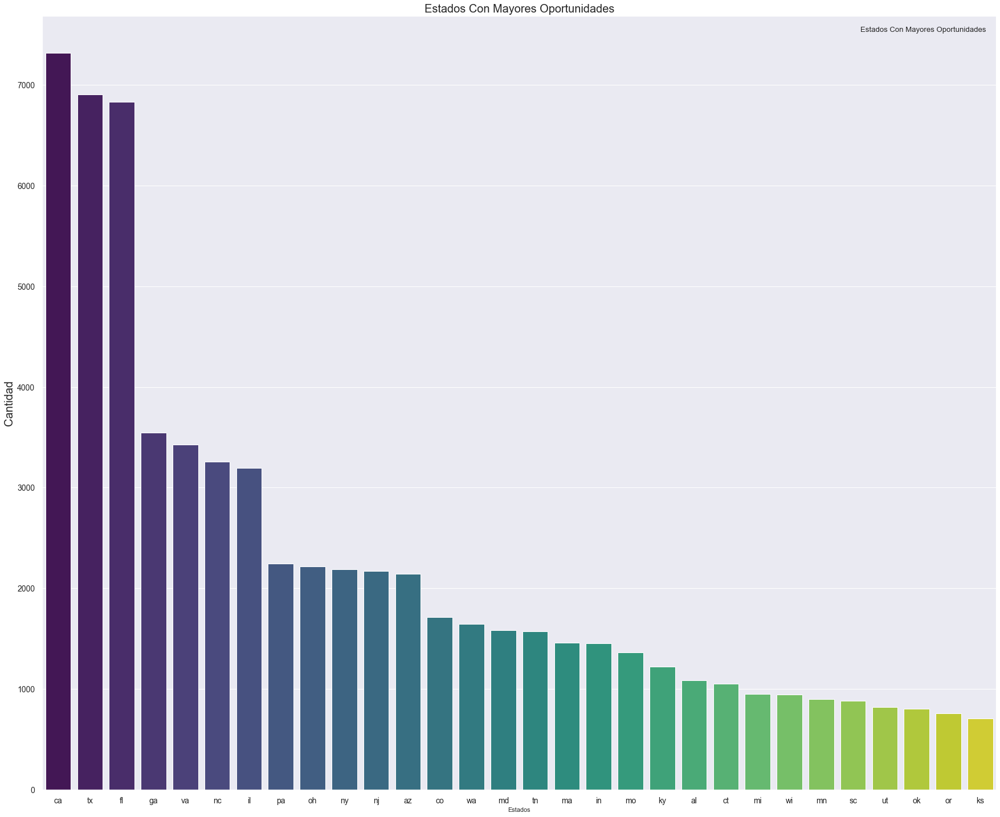

In [ ]:
f.get_barplot(sugerencias_compra['estado'], 'Estados Con Mayores Oportunidades', 'Estados', 'Cantidad')

In [ ]:
df.loc[(df['modelo']=='cruzesedan') & (df['fabricante']=='chevrolet')].describe()

,precio,anio_fabricacion,kilometraje,rango_anio,rango_kilometros
count,2998.000000,2998.000000,2998.000000,2998.0,2998.000000
mean,15022.642095,2015.961308,11.851459,2.0,3.068712
std,3493.039156,2.029275,2.981241,0.0,1.815832
min,1718.000000,2012.000000,1.495349,2.0,0.000000
25%,14252.750000,2017.000000,10.208688,2.0,2.000000
50%,16000.000000,2017.000000,11.319401,2.0,3.000000
75%,16995.000000,2017.000000,12.667876,2.0,3.000000
max,25899.000000,2018.000000,20.899097,2.0,10.000000


In [ ]:
sugerencias_compra.loc[(sugerencias_compra['modelo_new']=='cruze')]

,precio venta,precio predicho de mercado,roi,decision,anio_fabricacion,kilometraje,ciudad_transaccion,estado,fabricante,modelo,pais_origen,categoria,planta,rango_anio,rango_kilometros,gama,modelo_new
102620,5977,21159.313113,254.012266,1,2012,18.444311,villa park,il,chevrolet,cruzesedan,1,1,7,2.0,8.0,media,cruze
105944,5555,18808.372013,238.584555,1,2011,19.172658,buffalo,mn,chevrolet,cruze4dr,1,1,7,2.0,8.0,media,cruze
99330,7990,25322.515792,216.927607,1,2014,17.315165,mairetta,ga,chevrolet,cruze1lt,1,1,7,2.0,7.0,media,cruze
105216,8000,25322.515792,216.531447,1,2013,18.445068,grand rapids,mi,chevrolet,cruze1lt,1,1,7,2.0,8.0,media,cruze
93160,8653,26039.823202,200.934048,1,2014,16.229979,kendall,fl,chevrolet,cruze1lt,1,1,7,2.0,6.0,media,cruze
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97658,17980,19592.281064,8.967080,1,2017,11.034213,killeen,tx,chevrolet,cruzesedan,1,1,7,2.0,2.0,media,cruze
106039,18909,20601.892368,8.952839,1,2017,10.176284,boyertown,pa,chevrolet,cruzesedan,1,1,7,2.0,2.0,media,cruze
99657,15699,17083.124877,8.816644,1,2016,11.104621,mesa,az,chevrolet,cruzelt,1,1,7,2.0,2.0,media,cruze
100572,16495,17881.209726,8.403818,1,2015,11.697365,fort payne,al,chevrolet,cruzeltz,1,1,7,2.0,3.0,media,cruze


In [ ]:
sugerencias_compra.describe()

,precio venta,precio predicho de mercado,roi,decision,anio_fabricacion,kilometraje,rango_anio,rango_kilometros
count,71960.000000,71960.000000,71960.000000,71960.0,71960.000000,71960.000000,71960.000000,71960.000000
mean,13397.193719,20244.621496,65.388621,1.0,2012.771234,15.219777,1.758227,5.229197
std,3828.006384,2908.978304,64.353295,0.0,3.395096,2.720607,0.441960,1.928656
min,1500.000000,13291.731579,8.000118,1.0,1997.000000,1.495349,0.000000,0.000000
25%,10900.000000,17641.256652,24.446854,1.0,2011.000000,13.458652,2.000000,4.000000
50%,13548.000000,19916.068259,46.234323,1.0,2014.000000,15.131014,2.000000,5.000000
75%,15995.000000,22001.271486,83.648837,1.0,2015.000000,17.316321,2.000000,7.000000
max,25500.000000,27540.030100,1060.213577,1.0,2018.000000,22.357839,2.000000,11.000000


In [ ]:
sugerencias_compra.agg({'roi':['min','mean','max'],'precio predicho de mercado':['min','mean','max']})

,roi,precio predicho de mercado
min,8.000118,13291.731579
mean,65.388621,20244.621496
max,1060.213577,27540.030100


In [ ]:
roi_marcas=pd.DataFrame(sugerencias_compra.groupby(['fabricante']).agg({'roi':['min','mean','max'],'precio predicho de mercado':['min','mean','max']}))
roi_marcas.reset_index(inplace=False)
roi_marcas.roi

,min,mean,max
fabricante,,,
acura,8.230386,65.020425,677.339188
audi,8.120008,74.083668,389.834755
bmw,8.000118,74.103724,415.094875
buick,8.004505,48.929220,344.841593
cadillac,8.041806,65.769910,338.340621
chevrolet,8.009046,64.204282,780.050859
chrysler,8.000118,77.950265,913.775321
dodge,8.017062,65.213394,1031.718584
fiat,9.828470,116.832443,346.577102


In [ ]:
roi_estados=pd.DataFrame(sugerencias_compra.groupby(['estado']).agg({'roi':['min','mean','max'],'precio predicho de mercado':['min','mean','max']}))
roi_estados.reset_index(inplace=False)
roi_estados

roi                          precio predicho de mercado  \
               min        mean          max                        min   
estado                                                                   
ak        9.122783   67.368491   237.613004               14734.768501   
al        8.010449   58.326422  1060.213577               13291.731579   
ar        8.001578   50.821043   573.396906               13291.731579   
az        8.010664   65.307811   462.313089               13291.731579   
ca        8.000850   59.272210   746.711209               13291.731579   
co        8.000712   64.621983   621.956351               13291.731579   
ct        8.027076   66.249418   434.871954               13291.731579   
dc      133.379946  149.337388   165.294831               16917.712270   
de        8.322497   54.588826   274.934262               13353.834050   
fl        8.009046   67.871581  1034.677585               13291.731579   
ga        8.005273   66.194195   490.186036               13291.731579   
hi        8.331307   74.465335   901.467458               13353.834050   
ia        8.062801   64.369369   602.010382               13291.731579   
id        8.272883   63.070446   401.951007               13291.731579   
il        8.035778   71.985022   986.735259               13291.731579   
in        8.121044   68.676189   744.563387               13291.731579   
ks        8.041806   61.802782   600.254657               13291.731579   
ky        8.000118   63.332759  1031.718584               13291.731579   
la        8.058953   55.775780   449.602831               14724.770981   
ma        8.017062   56.308179   470.663858               13291.731579   
md        8.062461   62.447580   490.092812               13291.731579   
me        8.334158   64.621996   329.349469               15112.044631   
mi        8.007264   76.158101   668.718650               13291.731579   
mn        8.019080   64.443742   491.333943               13291.731579   
mo        8.001506   58.768614   586.081395               13291.731579   
ms        8.005778   53.314822   370.406311               13353.834050   
mt        8.698855   64.199259   342.794798               13492.192241   
nc        8.004505   63.805803   631.299184               13291.731579   
nd        8.132314   60.102804   323.416877               13291.731579   
ne        8.035800   75.166533   529.073281               14724.770981   
nh        8.057394   58.820190   439.564051               14734.768501   
nj        8.001244   76.003244   882.774263               13291.731579   
nm        8.788759   53.375546   196.122562               13291.731579   
nv        8.614932   59.804637   300.707290               13291.731579   
ny        8.022804   59.100268   392.898636               13291.731579   
oh        8.032616   73.960243   915.105235               13291.731579   
ok        8.085223   65.090967   648.209309               13291.731579   
or        8.010449   60.435007   380.341156               13291.731579   
pa        8.017785   67.596725   974.103943               13291.731579   
ri        8.175922   59.824183   248.356114               15112.044631   
sc        8.062572   59.901148   535.963048               13291.731579   
sd        8.258480   76.816739   600.596579               14786.873453   
tn        8.068449   64.720735   485.260476               13353.834050   
tx        8.000118   62.803204   754.899057               13291.731579   
ut        8.023428   73.806735   913.775321               13353.834050   
va        8.050966   80.907064   849.469077               13291.731579   
vt        9.452613   72.129787   358.224164               13291.731579   
wa        8.004354   63.995861   645.820461               13291.731579   
wi        8.020333   67.942487   656.330600               13291.731579   
wv        8.532536   43.105074   281.812630               13291.731579   
wy       14.633176   62.637345   239.100266               15931.411740   

                  

In [ ]:
df.loc[(df['fabricante']=='dodge') & (df['modelo']=='ram')& (df['anio_fabricacion']==2005)].sort_values('precio',ascending=True).describe()

,precio,anio_fabricacion,kilometraje,rango_anio,rango_kilometros
count,383.000000,383.0,383.000000,383.0,383.000000
mean,15592.159269,2005.0,18.581557,1.0,7.861619
std,7060.858723,0.0,1.977709,0.0,1.671806
min,4677.000000,2005.0,6.685731,1.0,1.000000
25%,9999.000000,2005.0,17.642435,1.0,7.000000
50%,13990.000000,2005.0,18.802414,1.0,8.000000
75%,19995.000000,2005.0,20.009946,1.0,9.000000
max,54995.000000,2005.0,22.219391,1.0,11.000000


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


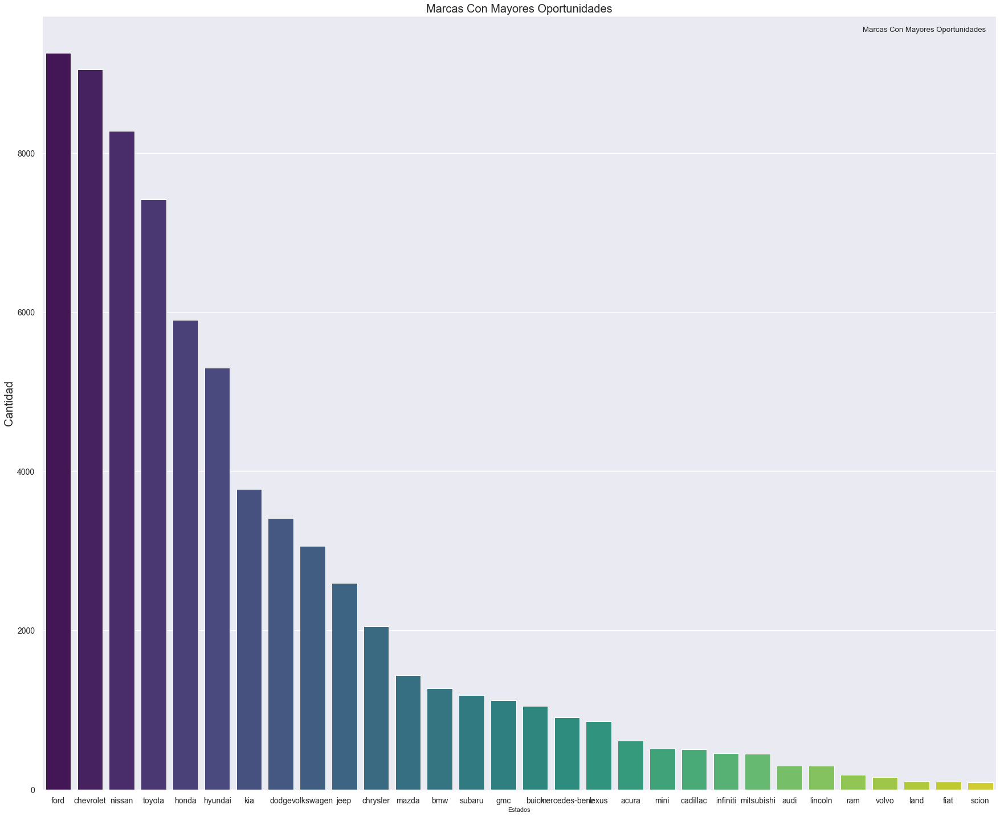

In [ ]:
f.get_barplot(sugerencias_compra['fabricante'], 'Marcas Con Mayores Oportunidades', 'Estados', 'Cantidad')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


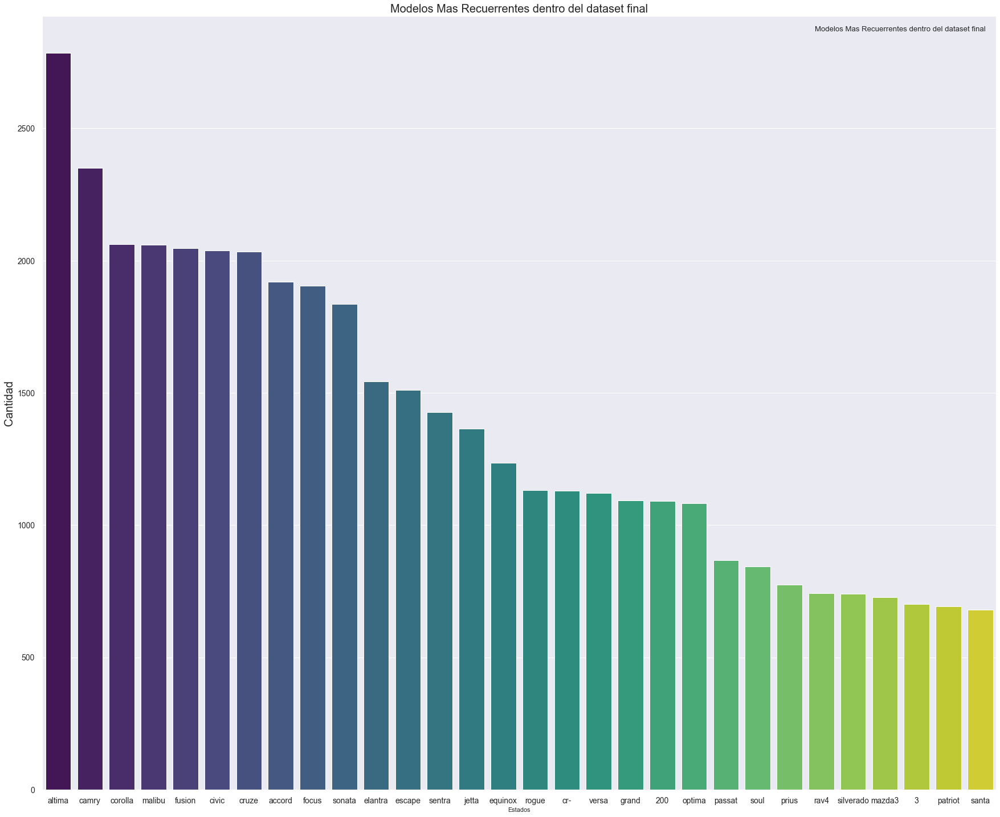

In [ ]:
f.get_barplot(sugerencias_compra['modelo_new'], 'Modelos Mas Recuerrentes dentro del dataset final', 'Estados', 'Cantidad')

In [ ]:
ford_focus=sugerencias_compra.loc[(df['modelo_new']=='focus')]

In [ ]:
ford_focus

,precio venta,precio predicho de mercado,roi,decision,anio_fabricacion,kilometraje,ciudad_transaccion,estado,fabricante,modelo,pais_origen,categoria,planta,rango_anio,rango_kilometros,gama,modelo_new
268260,2588,18172.812327,602.195221,1,2005,18.652601,dallas,tx,ford,focus5dr,3,A,R,1.0,8.0,media,focus
261759,2995,20945.026892,599.333118,1,2008,18.449528,crest hill,il,ford,focus2dr,1,A,W,1.0,8.0,media,focus
316387,2999,20195.173219,573.396906,1,2009,19.840316,little rock,ar,ford,focus4dr,1,A,W,1.0,9.0,media,focus
275194,2999,18743.472590,524.990750,1,2005,19.386020,chantilly,va,ford,focus4dr,1,A,W,1.0,9.0,media,focus
277375,2900,17032.685843,487.333995,1,2005,20.009181,sterling heights,mi,ford,focus4dr,1,A,W,1.0,9.0,media,focus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
322178,19285,21022.046352,9.007241,1,2015,13.000569,denton,md,ford,focussedan,1,A,L,2.0,4.0,media,focus
268453,21997,23945.765530,8.859233,1,2017,7.840508,irving,tx,ford,focusst,1,A,L,2.0,1.0,media,focus
266374,18993,20674.605042,8.853815,1,2016,10.613248,roslyn,pa,ford,focushatchback,1,A,L,2.0,2.0,media,focus
264778,14995,16210.267378,8.104484,1,2014,13.887406,colma,ca,ford,focushatchback,1,A,L,2.0,4.0,media,focus


In [ ]:
ford_focus=sugerencias_compra.loc[(sugerencias_compra['modelo_new']=='focus')]
ford_focus=pd.DataFrame(ford_focus.groupby(['rango_anio','rango_kilometros']).agg({'precio venta':['min','mean','max'],'precio predicho de mercado':['min','mean','max']}))
ford_focus.reset_index(inplace=True)
ford_focus

rango_anio rango_kilometros precio venta                       \
                                        min          mean    max   
0         1.0              6.0         3999   6724.565217   9695   
1         1.0              7.0         2995   5945.857143  10295   
2         1.0              8.0         2588   4828.027027   7965   
3         1.0              9.0         2900   4352.111111   7988   
4         2.0              0.0        10999  16669.684211  23184   
5         2.0              1.0         9999  14836.204545  21997   
6         2.0              2.0         9841  14077.622807  22950   
7         2.0              3.0         8979  13178.596491  21997   
8         2.0              4.0         7295  12098.390953  19285   
9         2.0              5.0         5904  10945.070621  18990   
10        2.0              6.0         5980   9688.560440  17890   
11        2.0              7.0         3995   8334.369048  14195   
12        2.0              8.0         5693   7533.368421  12900   

   precio predicho de mercado                              
                          min          mean           max  
0                14843.718042  20197.753497  27540.030100  
1                14724.770981  19522.479713  27540.030100  
2                14761.499347  19330.113898  24559.353699  
3                15606.959803  18832.549779  21159.313113  
4                15112.044631  21661.946242  27540.030100  
5                15023.846007  20078.900976  25911.706828  
6                14724.770981  21383.551707  27540.030100  
7                13291.731579  20270.540966  27540.030100  
8                13492.192241  20127.956278  27540.030100  
9                14724.770981  20419.837862  26603.403381  
10               14724.770981  20099.943339  27540.030100  
11               13291.731579  19324.938954  27540.030100  
12               17058.208113  18897.896296  25911.706828

In [ ]:
ford_focus_totaldf=df.loc[(df['modelo_new']=='focus')& (df['rango_anio']==2)]
ford_focus_totaldf=pd.DataFrame(ford_focus_totaldf.groupby(['rango_anio','rango_kilometros']).agg({'precio':['min','mean','max']}))
ford_focus_totaldf.reset_index(inplace=True)
ford_focus_totaldf

rango_anio rango_kilometros precio                     
                                 min          mean    max
0        2.0              0.0  10999  20261.800000  47470
1        2.0              1.0   6995  17839.052632  39999
2        2.0              2.0   8994  15078.065527  37488
3        2.0              3.0   7995  13521.331081  99999
4        2.0              4.0   7161  12309.780869  99999
5        2.0              5.0   5904  11121.202724  99999
6        2.0              6.0   4990   9462.595517  18867
7        2.0              7.0   1952   8260.858650  15995
8        2.0              8.0   3995   7227.091743  14995
9        2.0              9.0   4599   6162.210526   8788

In [ ]:
sugerencias_compra

,precio venta,precio predicho de mercado,roi,decision,anio_fabricacion,kilometraje,ciudad_transaccion,estado,fabricante,modelo,pais_origen,categoria,planta,rango_anio,rango_kilometros,gama,modelo_new
594083,1500,17403.203653,1060.213577,1,2004,19.184318,scottsboro,al,mazda,mazda64dr,1,V,5,1.0,8.0,media,mazda6
456488,1600,18154.841368,1034.677585,1,2004,19.354477,davie,fl,hyundai,santa,K,8,U,1.0,8.0,media,santa
226503,1500,16975.778763,1031.718584,1,1999,21.394172,middlesboro,ky,dodge,ram,1,7,J,0.0,10.0,media,ram
217945,1750,19017.867029,986.735259,1,2008,19.736527,chicago,il,dodge,grand,1,8,B,1.0,9.0,media,grand
279450,1950,20945.026892,974.103943,1,2002,19.637613,levittown,pa,ford,explorer4dr,1,M,U,0.0,9.0,media,explorer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439292,15891,17162.477711,8.001244,1,2014,11.586138,paramus,nj,hyundai,sonatagls,5,P,H,2.0,3.0,media,sonata
270127,20967,22644.538159,8.000850,1,2017,14.054618,victorville,ca,ford,escapefwd,1,M,U,2.0,4.0,media,escape
397361,17799,19223.046800,8.000712,1,2016,8.736978,colorado springs,co,honda,cr-vex,2,K,H,2.0,1.0,media,cr-
31688,25500,27540.030100,8.000118,1,2016,13.093880,louisville,ky,bmw,3,W,A,K,2.0,4.0,alta,3


In [ ]:
cruze=sugerencias_compra.loc[(sugerencias_compra['modelo_new']=='cruze')]
cruze=pd.DataFrame(cruze.groupby(['rango_anio','rango_kilometros']).agg({'precio venta':['min','mean','max'],'precio predicho de mercado':['min','mean','max']}))
cruze.reset_index(inplace=True)
cruze

rango_anio rango_kilometros precio venta                       \
                                       min          mean    max   
0        2.0              0.0        13988  16466.111111  18750   
1        2.0              1.0        12430  16494.416667  24173   
2        2.0              2.0        10995  15688.603030  19990   
3        2.0              3.0         9899  14252.055085  19495   
4        2.0              4.0         7994  12930.968442  18990   
5        2.0              5.0         7955  11997.832298  19995   
6        2.0              6.0         6900   9992.984615  16995   
7        2.0              7.0         6000   8854.787234  13098   
8        2.0              8.0         5555   7551.708333   9851   

  precio predicho de mercado                              
                         min          mean           max  
0               17529.241444  20063.786419  22977.465437  
1               16210.267378  21259.868879  27540.030100  
2               13353.834050  19478.463256  22977.465437  
3               13492.192241  20000.634790  27540.030100  
4               13291.731579  20135.107752  27540.030100  
5               13353.834050  19970.148494  26603.403381  
6               13291.731579  20376.874631  27540.030100  
7               13492.192241  18803.197332  27540.030100  
8               16731.702000  20145.003024  25322.515792

In [ ]:
cruze_all=sugerencias_compra.loc[(df['modelo_new']=='cruze') & (df['rango_anio']== 2)]
cruze_all=pd.DataFrame(df.groupby(['rango_anio','rango_kilometros']).agg({'precio':['min','mean','max']}))
cruze_all.reset_index(inplace=True)
cruze_all

rango_anio rango_kilometros precio                      
                                  min          mean     max
0         0.0              0.0   4965  28999.615385   59997
1         0.0              1.0   8975  42838.676471  174900
2         0.0              2.0   1900  36274.921053  164992
3         0.0              3.0   2295  33112.005952  224995
4         0.0              4.0   2999  20705.968338  199995
5         0.0              5.0   1950  14273.658446  189500
6         0.0              6.0   1500  10153.357669  119995
7         0.0              7.0   1500   7985.332943   99999
8         0.0              8.0   1500   6619.837050   99999
9         0.0              9.0   1500   5667.970696   99999
10        0.0             10.0   1500   5420.533560   99999
11        0.0             11.0   1500   5335.399637   99999
12        1.0              0.0   1985  40020.166667  234900
13        1.0              1.0   7284  83922.468531  490000
14        1.0              2.0   5978  46915.602459  315000
15        1.0              3.0   5331  31868.196386  229500
16        1.0              4.0   3990  21509.827457  199888
17        1.0              5.0   2500  16201.441698  114985
18        1.0              6.0   1799  13513.380222  109995
19        1.0              7.0   1500  11724.152718  155555
20        1.0              8.0   1500  10291.540389   99998
21        1.0              9.0   1500   9169.085267   99998
22        1.0             10.0   1500   8623.644624   99999
23        1.0             11.0   1500   8184.450094   88888
24        2.0              0.0   6000  36636.666201  469991
25        2.0              1.0   5888  33803.370281  499500
26        2.0              2.0   3500  29217.828095  449900
27        2.0              3.0   4500  25592.186791  304950
28        2.0              4.0   1899  22584.987133  287500
29        2.0              5.0   1718  20989.864158  124950
30        2.0              6.0   3750  18268.046251  184990
31        2.0              7.0   1952  15966.897699   99999
32        2.0              8.0   1995  14820.493890   99999
33        2.0              9.0   2500  14659.916049   80000
34        2.0             10.0   2998  14630.107692   45997
35        2.0             11.0   3495  16104.707792   39995

In [ ]:
sns.barplot(data=ford_focus,x='anio_fabricacion',y='precio')

ValueError: Could not interpret input 'anio_fabricacion'

In [ ]:
sns.barplot(data=sugerencias_compra,x='anio_fabricacion',y='precio predicho de mercado')

In [ ]:
f.get_pie(sugerencias_compra['gama'], 'Autos por Gama', 10)

In [ ]:
%matplotlib qt

# # Plot the results
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_compras.anio_fabricacion, df_compras.kilometraje, df_compras.precio, marker="o", c='red', s=8, cmap="RdBu", alpha=.5)
ax.scatter(df_no_compras.anio_fabricacion, df_no_compras.kilometraje, df_no_compras.precio, marker="o", c='green', s=8, cmap="RdBu", alpha=.5)
ax.title.set_text('Compras')

In [ ]:
f.calidad_datos(df)

---

## **Conclusiones**

* En el dataframe de recomendación no se encontró ningún auto de lujo, por lo que se sospecha que no había una cantidad suficiente de datos como para formar un grupo.
* Si bien en rigor los regresores funcionan, se encontraron casos en que la diferencia entre el precio predicho y el de venta es demasiado alto, por lo que existe la posibilidad que ese vehículo haya sido asignado a un grupo distinto al que debe pertenecer.
* Nuestro modelo es muy sensible a los errores de regresión ya que nos lleva a seleccionar autos que no eran una buena opción de compra porque el precio de venta se estimó con mucho error.
* Nos dimos cuenta que tendremos que buscar el equilibrio entre abarcar un mayor número de grupos versus tener grupos con más datos. Por ejemplo tenemos el caso en que seleccionamos un n mínimo muy alto (1500) el cual nos deja con pocos grupos, pero con bastante data (enfoque conservador). El problema es que estoy descartando posibles ofertas de autos ya que no calzan en ninguno de los grupos seleccionados.
* No hemos verificado si para cada modelo existen parámetros óptimos (GridSearch).
* Otra alternativa -> sin clusterización, y segmentar más con foco de negocio (con el objeto que no se pierdan tantos datos en el análisis). También se podría dividir el dataset en 3 grupos según gama, por ejemplo, y desde ahí analizar para cada uno.  

HOLA

---